In [1]:
from __future__ import print_function
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as Dataset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
import pickle
from torch.utils.data import Subset

manualSeed = 999
random.seed(manualSeed)
torch.manual_seed(manualSeed)
device=torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

### Hyperparameters

In [3]:
#Hyperparameters
LEARNING_RATE = 1e-4
BATCH_SIZE = 64
IMAGE_SIZE = 64
IMAGE_CHANNELS = 3
Z_DIM = 100
EPOCHS = 50
DISC_FEATURES = 64
GEN_FEATURES = 64
CRITIC_ITERS = 7
LAMBDA_GP = 10

### Download Images for Training

In [4]:
transform = transforms.Compose([
    transforms.Resize(IMAGE_SIZE),
    transforms.CenterCrop(IMAGE_SIZE),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])
trainset = Dataset.CIFAR10('./data', download=True, transform=transform)
test = Dataset.CIFAR10('./data', download=True, train=False, transform=transform)
trainset=trainset+test

trainloader = torch.utils.data.DataLoader(trainset, shuffle=True, batch_size=BATCH_SIZE)
len(trainset)

Files already downloaded and verified
Files already downloaded and verified


60000

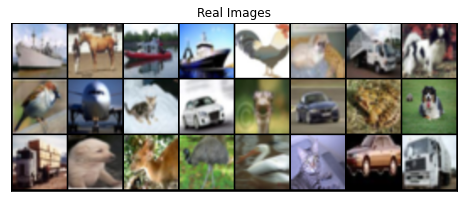

In [5]:
def imshow(imgs, title, figsize=(8,8), nrow=8):
    imgs = vutils.make_grid(imgs, nrow, normalize=True)
    imgs=imgs.numpy()
    plt.figure(figsize=figsize)
    plt.imshow(np.transpose(imgs, (1,2,0)))
    plt.xticks([])
    plt.yticks([])
    plt.title(title)
    plt.show()
    
images, labels = next(iter(trainloader))
imshow(images[:24], 'Real Images')

### Generator and Discriminator Models

In [6]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.net = nn.Sequential(
            #nn.ConvTranspose2d(Z_DIM, GEN_FEATURES*8, 4, 1, 0, bias=False)
            self._block(Z_DIM, GEN_FEATURES*8, 4, 1, 0),           # 512 x 4 x 4
            self._block(GEN_FEATURES*8, GEN_FEATURES*4, 4, 2, 1),  # 256 x 8 x 8
            self._block(GEN_FEATURES*4, GEN_FEATURES*2, 4, 2, 1),  # 128 x 16 x 16
            self._block(GEN_FEATURES*2, GEN_FEATURES, 4, 2, 1),      # 64 x 32 x 32
            nn.ConvTranspose2d(GEN_FEATURES, IMAGE_CHANNELS, 4, 2, 1),
            nn.Tanh() #size. (n_channels) x 64 x 64
        
        )
        
    def _block(self, in_channels, out_channels, kernel, stride, padding):
        return nn.Sequential(nn.ConvTranspose2d(in_channels, out_channels, kernel, stride, padding, bias=False),
                             nn.BatchNorm2d(out_channels),
                             nn.ReLU(True)
                            )
    
    def forward(self, z):
        return self.net(z)


In [7]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.net = nn.Sequential(
            # input size: 3 x 64 x 64
            nn.Conv2d(IMAGE_CHANNELS, DISC_FEATURES, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),                          # 64 x 32 x 32
            self._block(DISC_FEATURES, DISC_FEATURES*2, 4, 2, 1),     # 128 x 16 x 16
            self._block(DISC_FEATURES*2, DISC_FEATURES*4, 4, 2, 1),   # 256 x 8 x 8
            self._block(DISC_FEATURES*4, DISC_FEATURES*8, 4, 2, 1),   # 512 x 4 x 4
            nn.Conv2d(DISC_FEATURES*8, 1, 4, 1, 0, bias=False),       # 1 x 1 x 1
        )
        
        
    def _block(self, in_channels, out_channels, kernel, stride, padding):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel, stride, padding, bias=False),
            nn.InstanceNorm2d(out_channels, affine=True),
            nn.LeakyReLU(0.2, inplace=True),
        )
    
    def forward(self, x):
        return self.net(x)


In [9]:
def weight_initialization(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [10]:
def gradientPenalty(critic, real, fake):
    batch_size, C, H, W = real.shape
    eps = torch.rand(batch_size, 1, 1, 1).repeat(1, C, H, W).to(device)
    interpolation = real*eps + fake*(1-eps)
    
    #compute critic scores
    mixed_scores = critic(interpolation)
    
    gradient = torch.autograd.grad(inputs=interpolation,
                                  outputs=mixed_scores,
                                  grad_outputs=torch.ones_like(mixed_scores),
                                  create_graph=True,
                                  retain_graph=True)[0]
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    return gradient_penalty

In [11]:
#Initialize the models and apply weight initialization            
CriticModel = Discriminator().to(device)
GenModel = Generator().to(device)

CriticModel.apply(weight_initialization)
GenModel.apply(weight_initialization)

#latent vector to visualize the performance of the generator
fixed_noise = torch.randn(32, Z_DIM, 1, 1).to(device)

#critic_optimizer = optim.RMSprop(CriticModel.parameters(), lr=LEARNING_RATE)
#gen_optimizer = optim.RMSprop(GenModel.parameters(), lr=LEARNING_RATE)

critic_optimizer = optim.Adam(CriticModel.parameters(), lr=LEARNING_RATE, betas=(0.0, 0.9))
gen_optimizer = optim.Adam(GenModel.parameters(), lr=LEARNING_RATE, betas=(0.0, 0.9))

### Training

[10/50]   Loss_D:-10.01785659790039   Loss_G:44.3398551940918


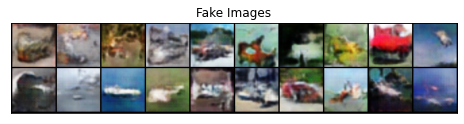

[20/50]   Loss_D:-9.366143226623535   Loss_G:32.65831756591797


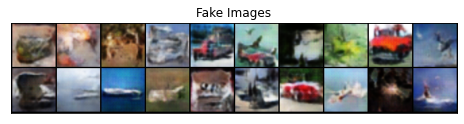

[30/50]   Loss_D:-8.428474426269531   Loss_G:21.76795196533203


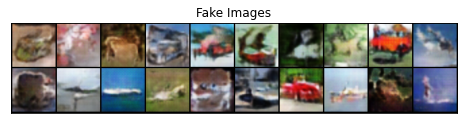

[40/50]   Loss_D:-9.764205932617188   Loss_G:15.560192108154297


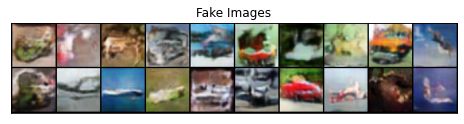

[50/50]   Loss_D:-8.093910217285156   Loss_G:9.282633781433105


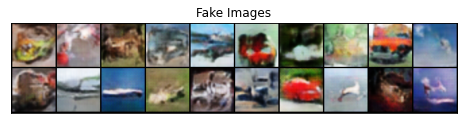

In [14]:
img_list = []
GEN_LOSS = []
CRITIC_LOSS = []
FID_score = []

for epoch in range(1,EPOCHS+1):
    GenModel.train()
    CriticModel.train()
    for i, (real, _) in enumerate(trainloader):
        real = real.to(device)
        
        
        #### (1) TRAIN CRITIC (DISCRIMINATOR) TO MAXIMIZE LOSS
        for _ in range(CRITIC_ITERS):
            mb_size = real.size(0)
            
            CriticModel.zero_grad()    
            noise = torch.randn(mb_size, Z_DIM, 1, 1).to(device)
            #generate fake images
            fake = GenModel(noise)
            #train critic with real images
            critic_real = CriticModel(real).view(-1)
            #train discriminator with fake images
            critic_fake = CriticModel(fake.detach()).view(-1)
            #compute gradient penalty
            GP = gradientPenalty(CriticModel, real, fake)
            # Calculate loss on both real real and fake with gradient penalty
            critic_loss = (-(torch.mean(critic_real) - torch.mean(critic_fake)) + LAMBDA_GP*GP)
            critic_loss.backward(retain_graph=True)
            critic_optimizer.step()
            
        
        #### (2) TRAIN GENERATOR TO MINIMIZE LOSS
        GenModel.zero_grad()
        output = CriticModel(fake).view(-1)
        #calculate gen's loss
        lossGen = -torch.mean(output)
        lossGen.backward()
        #update generatir
        gen_optimizer.step()
        
        #if i%100 == 0:
        #save both losses for plot
        GEN_LOSS.append(lossGen.item())
        CRITIC_LOSS.append(critic_loss.item())
        
    with torch.no_grad():
        GenModel.eval()
        fakes = GenModel(fixed_noise).detach().cpu()
    img_list.append(vutils.make_grid(fakes, padding=2, normalize=True))
    
    vutils.save_image(real.cpu(),'Images/wgangpimages/real/image{}.png'.format(epoch), nrow=10, normalize=True)
    vutils.save_image(fakes.cpu(),'Images/wgangpimages/fake/image{}.png'.format(epoch), nrow=10, normalize=True)
    
    #compute fid score
    #fid_score = compute_fidScore(real, fakes)
    #FID_score.append(fid_score)
    
    if epoch%10 == 0:
        print(f'[{epoch}/{EPOCHS}]   Loss_D:{critic_loss.item()}   Loss_G:{lossGen.item()}') #, FID_Score:{fid_score:.2f}')
        imshow(fakes[:20].cpu(), 'Fake Images', figsize=(8,8), nrow=10)

        
#save generated images
vutils.save_image(fakes[:10].cpu(),'Images/wganGPimage10.png', nrow=10)
vutils.save_image(fakes[:24].cpu(),'Images/wganGPimage.png')
vutils.save_image(fakes[:10].cpu(),'Images/wganGPimage10norm.png', nrow=10, normalize=True)
vutils.save_image(fakes[:24].cpu(),'Images/wganGPimagenorm.png', normalize=True)

#save entire model
torch.save(GenModel,'Models/wganGP.pth')  

#save losses to file
#save losses to file
losses = {'GenLoss': GEN_LOSS,
         'CriticLoss': CRITIC_LOSS}
with open('pickle/wganGP_loss.txt', 'wb') as f:
    pickle.dump(losses,f)

#save the generated images for visualization
with open('pickle/wganGPImg.txt', 'wb') as f:
    pickle.dump(img_list,f)

### Plot Loss

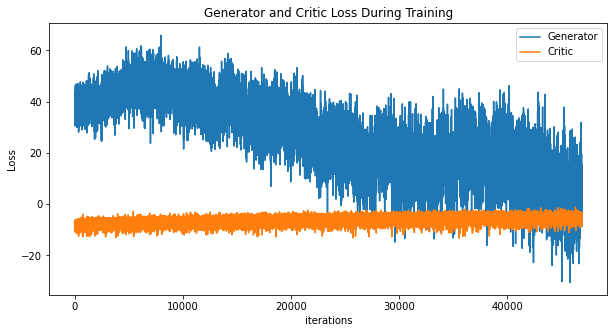

In [15]:
plt.figure(figsize=(10,5))
plt.title("Generator and Critic Loss During Training")
plt.plot(GEN_LOSS,label="Generator")
plt.plot(CRITIC_LOSS,label="Critic")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

### Compute FID Scores

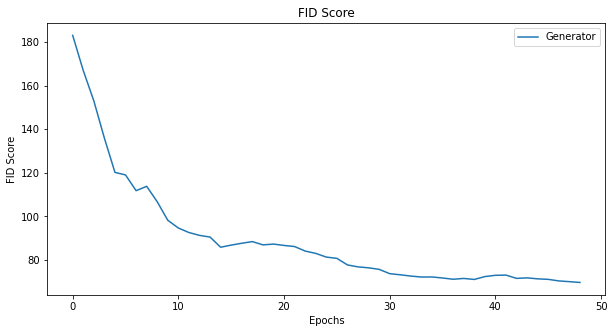

In [10]:
from FID import fidScore
wganGP_FID = []
for i in range(1,50):
    i = i+1
    fids = fidScore('Images/wgangpimages/real', 'Images/wgangpimages/fake',i,64)
    print(f'Epoch:{i} and FID Score: {fids}', end = '\r', flush=True)
    wganGP_FID.append(fids)
    

#save fid score list to file
with open('pickle/wganGPfid.txt', 'wb') as f:
    pickle.dump(wganGP_FID,f)
    
plt.figure(figsize=(10,5))
plt.title("FID Score")
plt.plot(wganGP_FID,label="Generator")
plt.xlabel("Epochs")
plt.ylabel("FID Score")
plt.legend()
plt.show()

### Plot FID loss for all the trained GAN models

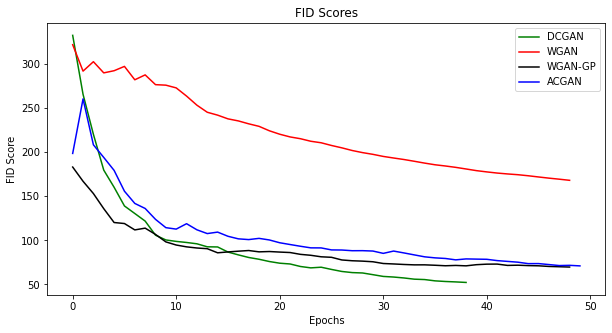

In [11]:
with open('pickle/dcganfid.txt', 'rb') as f:
    dcgan = pickle.load(f)
with open('pickle/wganfid.txt', 'rb') as f:
    wgan = pickle.load(f)
with open('pickle/wganGPfid.txt', 'rb') as f:
    wgangp = pickle.load(f)
with open('pickle/acganfid.txt', 'rb') as f:
    acgan = pickle.load(f)
    
plt.figure(figsize=(10,5))
plt.title("FID Scores")
plt.plot(dcgan,label="DCGAN", c='green')
plt.plot(wgan,label="WGAN", c='red')
plt.plot(wgangp,label="WGAN-GP", c='black')
plt.plot(acgan,label="ACGAN", c='blue')
plt.xlabel("Epochs")
plt.ylabel("FID Score")
plt.legend()
plt.show()

### Visualize animation of images generated at every epoch

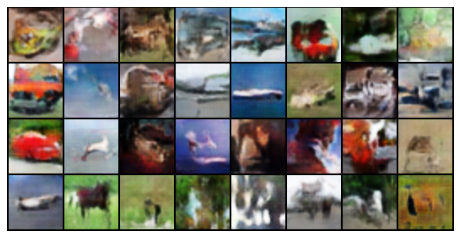

In [17]:
#using animation to display the progression of images generator for each epoch
with open('pickle/wganGPImg.txt', 'rb') as f:
    image_list = pickle.load(f)

fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i.cpu(),(1,2,0)), animated=True)] for i in image_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

In [ ]:
plt.imsave('wcgan_pg.png',fakes.cpu())

In [ ]:
imgs = vutils.make_grid(fakes.cpu(), nrow=8)
#need to conver images from tensor to numpy array inorder to plot
imgs=imgs.numpy()
plt.figure(figsize=(8,8))
plt.imshow(np.transpose(imgs, (1,2,0)))
plt.xticks([])
plt.yticks([])
plt.title('wgan_gp generated images')
plt.show()